#**Kenalan dengan sapi**

---

####**Fidzal Adrian** - 21/480604/PA/20882 <br/>
####**Raditya Rifan Zaidan** - 21/481025/PA/20926 <br>
####**Zaidurrohman** - 21/477632/PA/20678 <br/>
####**Rama Banin Maula** - 21/480955/PA/20920

###**Rumusan Masalah**

---

Diberikan 2 jenis gambar yaitu sapi tanpa background dan sapi dengan background.
Buatlah model pola sapi dengan gambar tanpa background. Kemudian gunakan pola tersebut untuk mendeteksi sapi dengan background. Gunakan interpolasi dan finite difference atau metode lain di dalam materi metode numerik.


#Langkah-langkah penyelesaian

##Mengakses Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Edge Detection dengan Finite Difference pada Gambar dengan Background

Percobaan edge detection dengan finite difference pada gambar sapi dengan background

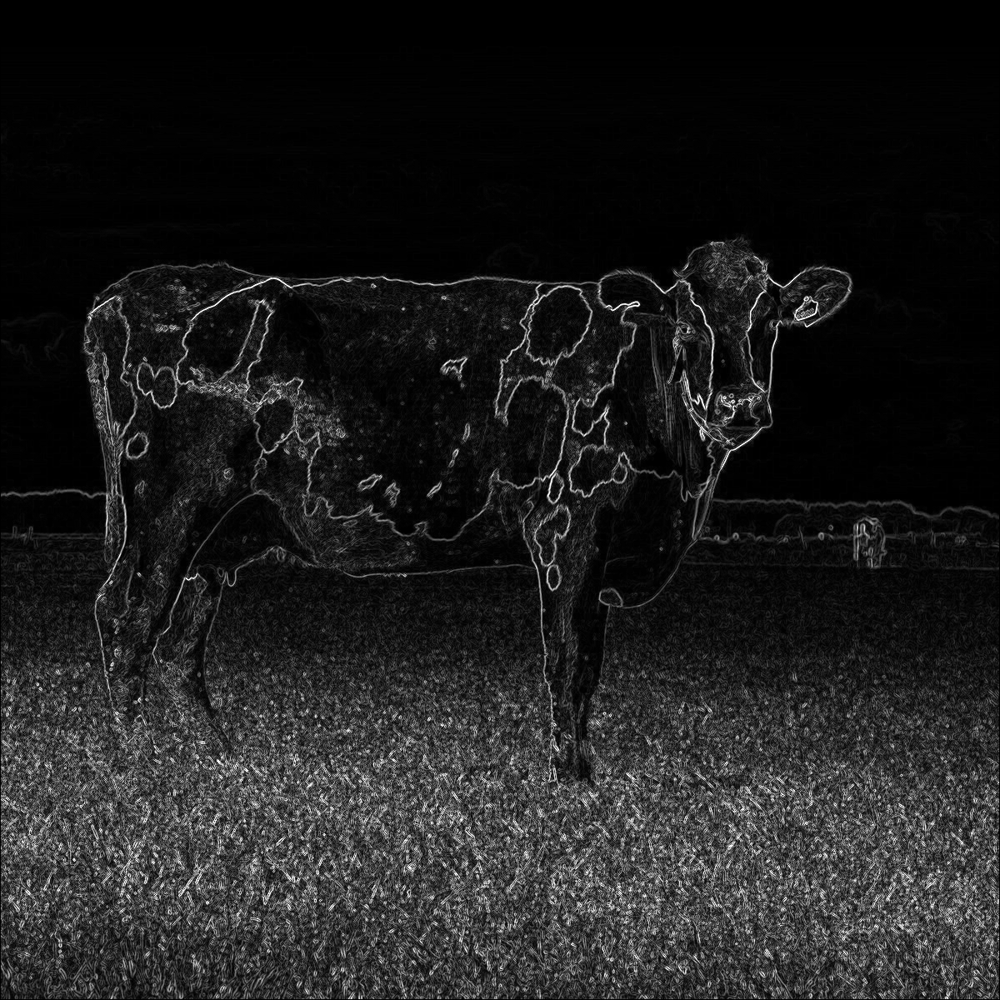

In [ ]:
from PIL import Image

# Load image
image = Image.open('/content/drive/MyDrive/sapiy.jpg').convert('L')
width, height = image.size

# Get pixel values
pixels = image.load()

# Apply finite difference kernel
edges = [[0] * height for _ in range(width)]
for y in range(1, height - 1):
    for x in range(1, width - 1):
        # Calculate finite differences in x and y directions
        dx = pixels[x + 1, y] - pixels[x - 1, y]
        dy = pixels[x, y + 1] - pixels[x, y - 1]
        magnitude = int((dx ** 2 + dy ** 2) ** 0.5)  # Magnitude of the gradient
        edges[x][y] = magnitude

# Normalize and convert back to uint8
max_magnitude = max(max(edges))
for y in range(height):
    for x in range(width):
        edges[x][y] = int(edges[x][y] * 255 / max_magnitude)

# Create a new image with edge pixels
edge_image = Image.new('L', (width, height))
edge_pixels = edge_image.load()
for y in range(height):
    for x in range(width):
        edge_pixels[x, y] = edges[x][y]

# Display the result
edge_image.show()

## Kontras Gambar

Melakukan kontras gambar dengan faktor kontras untuk mempertajam gambar

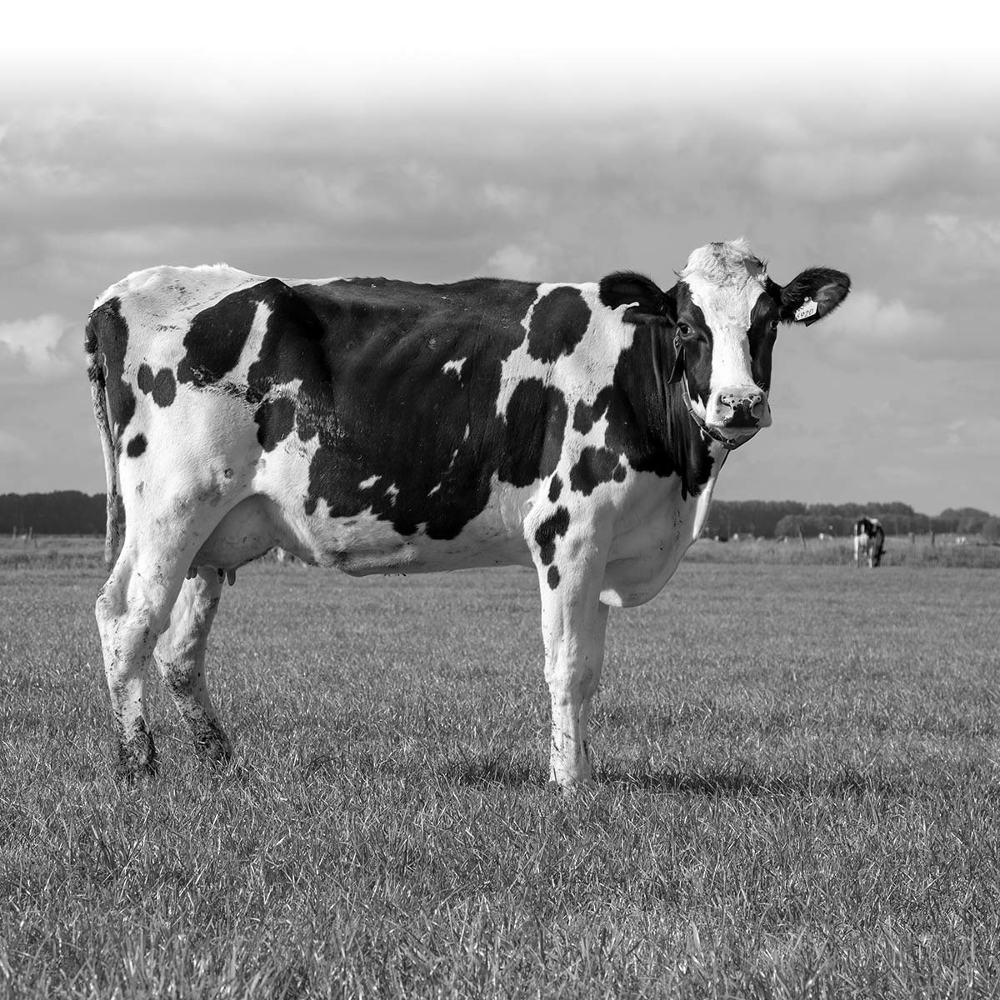

In [ ]:
from PIL import Image

# Baca gambar
gambar = Image.open('/content/drive/MyDrive/sapiy.jpg')

# Ubah gambar ke mode grayscale
gambar_grayscale = gambar.convert('L')

# Dapatkan matriks piksel
piksel = list(gambar_grayscale.getdata())

# Faktor kontras
faktor_kontras = 1
piksel_hasil = []

for p in piksel:
    piksel_baru = int(p * faktor_kontras)
    piksel_hasil.append(piksel_baru)

# Buat gambar baru dari matriks piksel yang telah dimodifikasi
gambar_hasil_kontras = Image.new('L', gambar_grayscale.size)
gambar_hasil_kontras.putdata(piksel_hasil)

# Tampilkan gambar hasil
gambar_hasil_kontras.show()

## Blur Gambar

Melakukan Gaussian Blur untuk memperkecil ketajaman dari rumput-rumput atau noise yang mengganggu

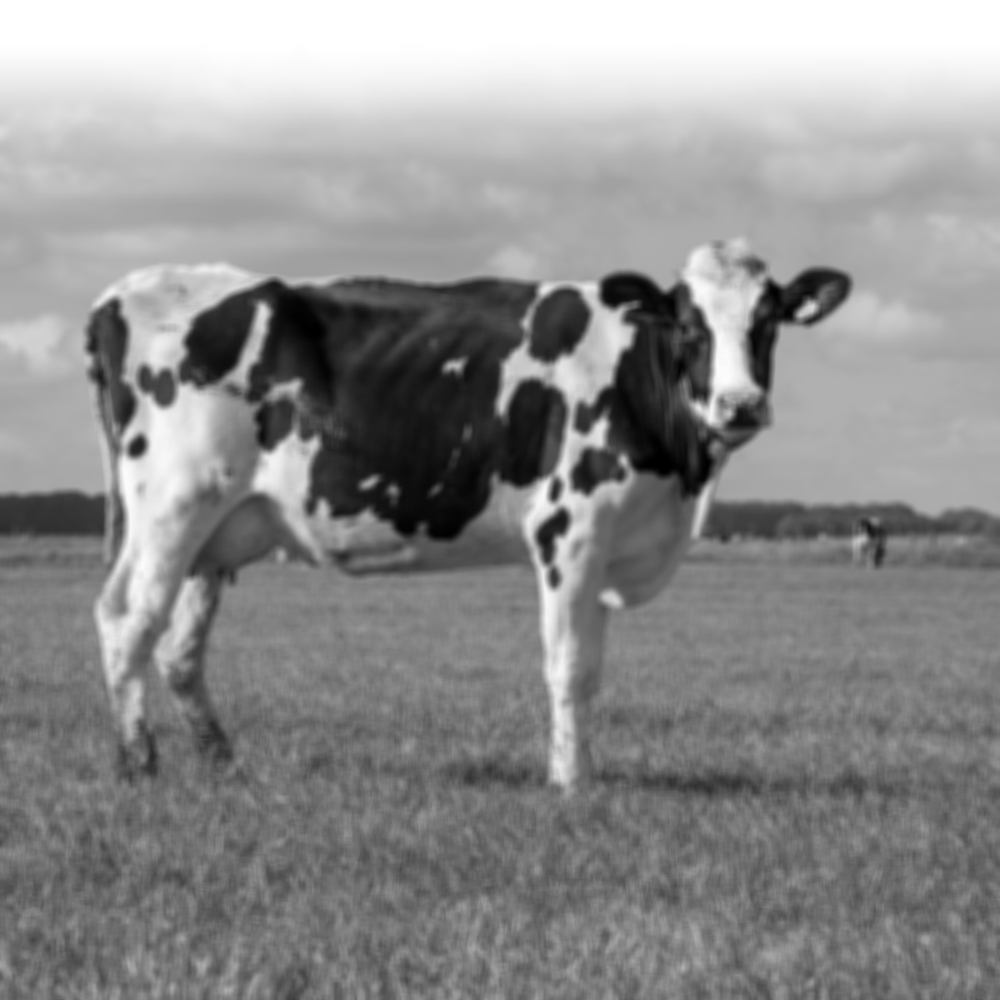

In [ ]:
from PIL import Image

# Baca gambar
gambar = gambar_hasil_kontras

# Dapatkan matriks piksel
piksel = list(gambar.getdata())

# Ukuran kernel blur (misalnya 3x3)
ukuran_kernel = 9

# Terapkan algoritma blur
piksel_hasil = []

for i in range(len(piksel)):
    # Dapatkan posisi piksel dalam matriks
    x = i % gambar.width
    y = i // gambar.width
    
    # Hitung rata-rata piksel sekitarnya
    total = 0
    count = 0
    
    for dx in range(-ukuran_kernel//2, ukuran_kernel//2+1):
        for dy in range(-ukuran_kernel//2, ukuran_kernel//2+1):
            if 0 <= x + dx < gambar.width and 0 <= y + dy < gambar.height:
                total += piksel[(y+dy) * gambar.width + (x+dx)]
                count += 1
    
    piksel_baru = int(total / count)
    piksel_hasil.append(piksel_baru)


# Buat gambar baru dari matriks piksel yang telah dimodifikasi
gambar_hasil_blur = Image.new('L', gambar.size)
gambar_hasil_blur.putdata(piksel_hasil)

# Tampilkan gambar hasil
gambar_hasil_blur.show()

## Edge Detetction dengan Finite Difference pada Gambar Blur

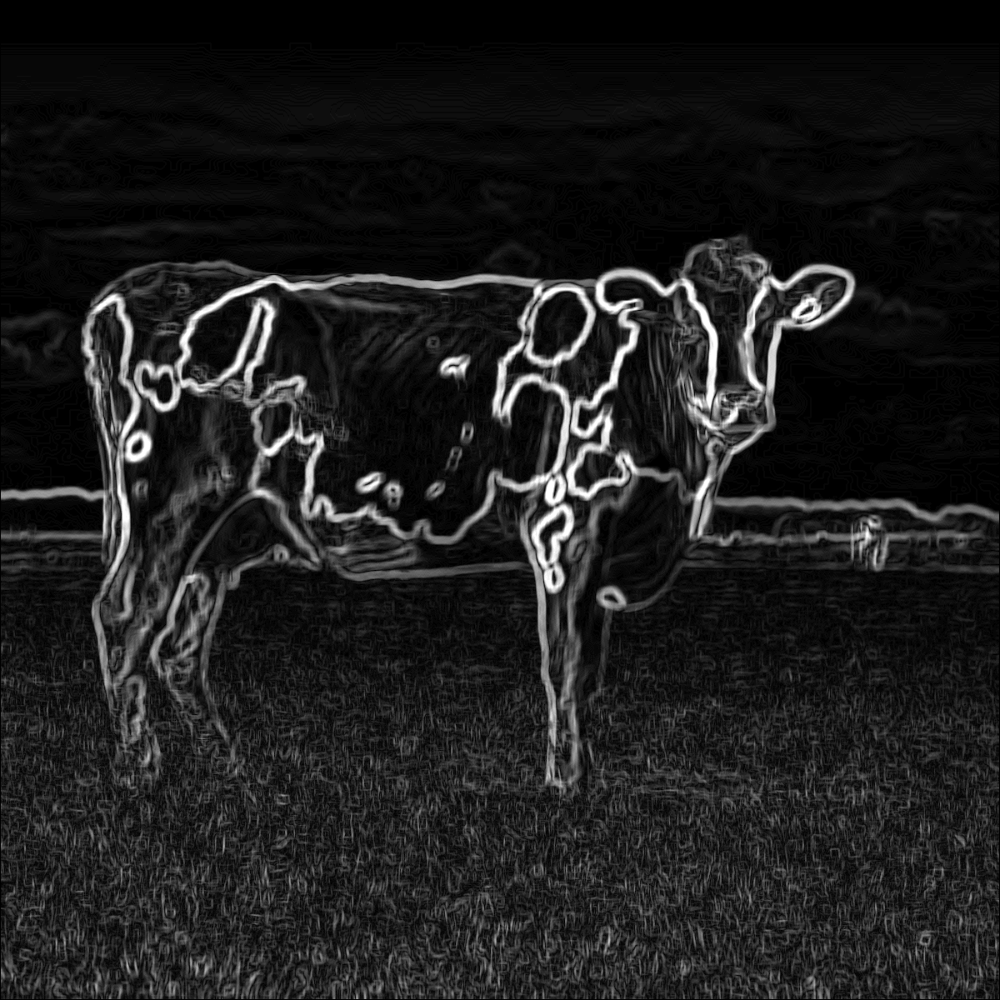

In [ ]:
from PIL import Image

# Load image
image = gambar_hasil_blur
width, height = image.size

# Get pixel values
pixels = image.load()

# Apply finite difference kernel
edges = [[0] * height for _ in range(width)]
for y in range(1, height - 1):
    for x in range(1, width - 1):
        # Calculate finite differences in x and y directions
        dx = pixels[x + 1, y] - pixels[x - 1, y]
        dy = pixels[x, y + 1] - pixels[x, y - 1]
        magnitude = int((dx ** 2 + dy ** 2) ** 0.5)  # Magnitude of the gradient
        edges[x][y] = magnitude

# Normalize and convert back to uint8
max_magnitude = max(max(edges))
for y in range(height):
    for x in range(width):
        edges[x][y] = int(edges[x][y] * 255 / max_magnitude)

# Create a new image with edge pixels
edge_image_bg = Image.new('L', (width, height))
edge_pixels = edge_image_bg.load()
for y in range(height):
    for x in range(width):
        edge_pixels[x, y] = edges[x][y]

# Display the result
edge_image_bg.show()

## Median Filter 

Median filter untuk mengurangi noise

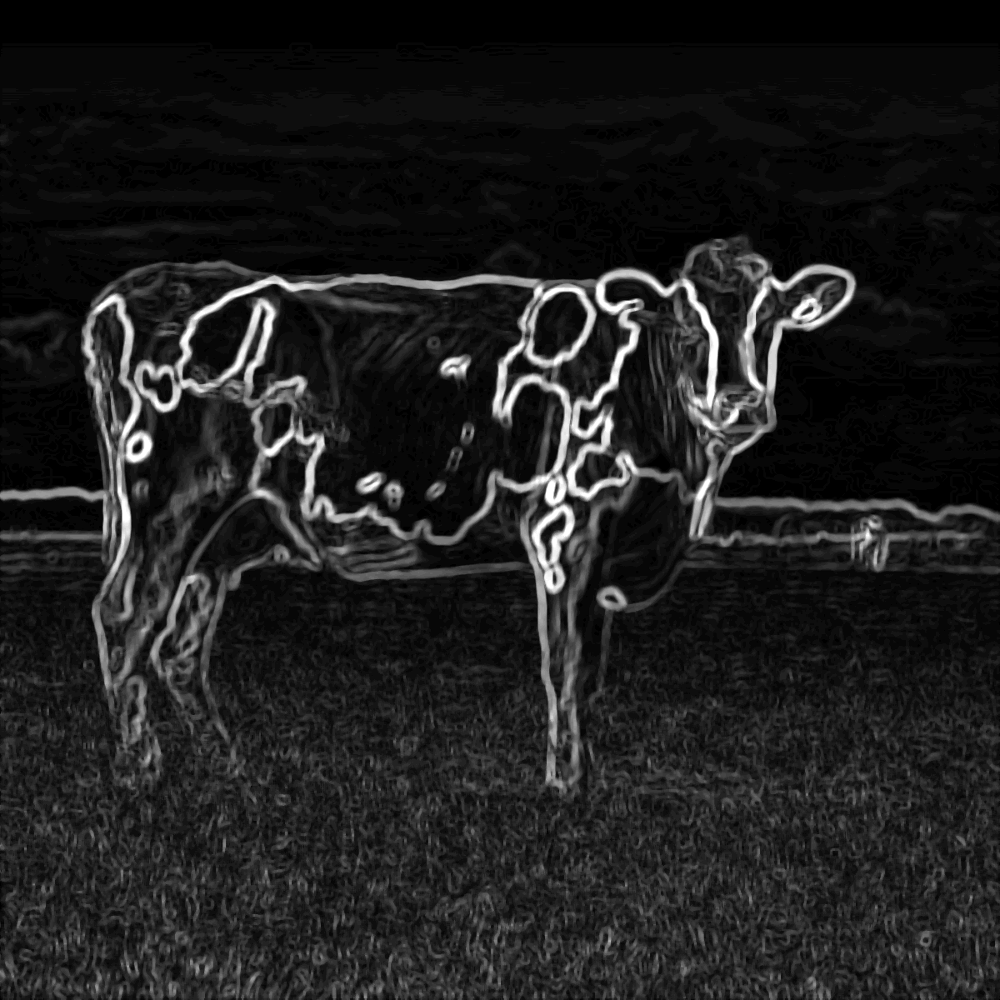

In [ ]:
from PIL import Image

# Baca gambar
gambar = edge_image_bg

# Dapatkan matriks piksel
piksel = list(gambar.getdata())

# Ukuran kernel Median Filter (misalnya 3x3)
ukuran_kernel = 3

# Terapkan Median Filter
piksel_hasil = []

for i in range(len(piksel)):
    # Dapatkan posisi piksel dalam matriks
    x = i % gambar.width
    y = i // gambar.width
    
    # Kumpulkan nilai piksel sekitarnya
    nilai_sekitar = []
    
    for dx in range(-ukuran_kernel//2, ukuran_kernel//2+1):
        for dy in range(-ukuran_kernel//2, ukuran_kernel//2+1):
            if 0 <= x + dx < gambar.width and 0 <= y + dy < gambar.height:
                nilai_sekitar.append(piksel[(y+dy) * gambar.width + (x+dx)])
    
    # Hitung nilai median
    piksel_baru = sorted(nilai_sekitar)[len(nilai_sekitar)//2]
    piksel_hasil.append(piksel_baru)

# Buat gambar baru dari matriks piksel yang telah dimodifikasi
gambar_hasil_medfil = Image.new('L', gambar.size)
gambar_hasil_medfil.putdata(piksel_hasil)

# Tampilkan gambar hasil
gambar_hasil_medfil.show()

## Sharpening

Sharpening untuk mempertajam garis edge yang telah dihasilkan dan resize ukuran menjadi 500x500 px

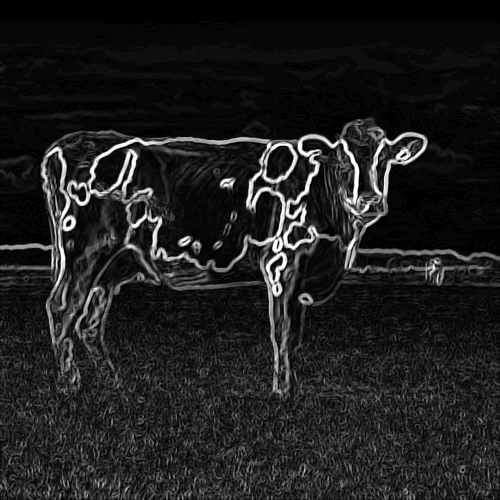

In [ ]:
from PIL import Image

# Baca gambar
gambar = gambar_hasil_medfil

# Dapatkan matriks piksel
piksel = list(gambar.getdata())

# Ukuran kernel sharpening (misalnya 3x3)
ukuran_kernel = 3

# Faktor sharpening (misalnya 1.5)
faktor_sharpening = 1.5

# Terapkan teknik sharpening
piksel_hasil = []

for i in range(len(piksel)):
    # Dapatkan posisi piksel dalam matriks
    x = i % gambar_grayscale.width
    y = i // gambar_grayscale.width
    
    # Kumpulkan nilai piksel sekitarnya
    nilai_sekitar = []
    
    for dx in range(-ukuran_kernel//2, ukuran_kernel//2+1):
        for dy in range(-ukuran_kernel//2, ukuran_kernel//2+1):
            if 0 <= x + dx < gambar_grayscale.width and 0 <= y + dy < gambar_grayscale.height:
                nilai_sekitar.append(piksel[(y+dy) * gambar_grayscale.width + (x+dx)])
    
    # Hitung rata-rata piksel sekitarnya
    rata_rata = sum(nilai_sekitar) / len(nilai_sekitar)
    
    # Hitung perbedaan antara piksel asli dan rata-rata piksel sekitarnya
    perbedaan = piksel[i] - rata_rata
    
    # Tambahkan perbedaan kembali ke piksel asli dengan faktor sharpening
    piksel_baru = piksel[i] + int(perbedaan * faktor_sharpening)
    
    # Pastikan nilai piksel baru berada dalam rentang 0-255
    piksel_baru = max(0, min(255, piksel_baru))
    
    piksel_hasil.append(piksel_baru)

# Buat gambar baru dari matriks piksel yang telah dimodifikasi
gambar_hasil = Image.new('L', gambar.size)
gambar_hasil.putdata(piksel_hasil)

# Ubah ukuran gambar menjadi 500x500
gambar_hasil500 = gambar_hasil.resize((500, 500))

# Tampilkan gambar hasil
gambar_hasil500.show()


In [ ]:
nama_file_hasil = '/content/drive/MyDrive/sapiyyy.jpg' 
gambar_hasil500.save(nama_file_hasil)

## Edge Detection dengan Finite Difference pada Gambar Tanpa Background

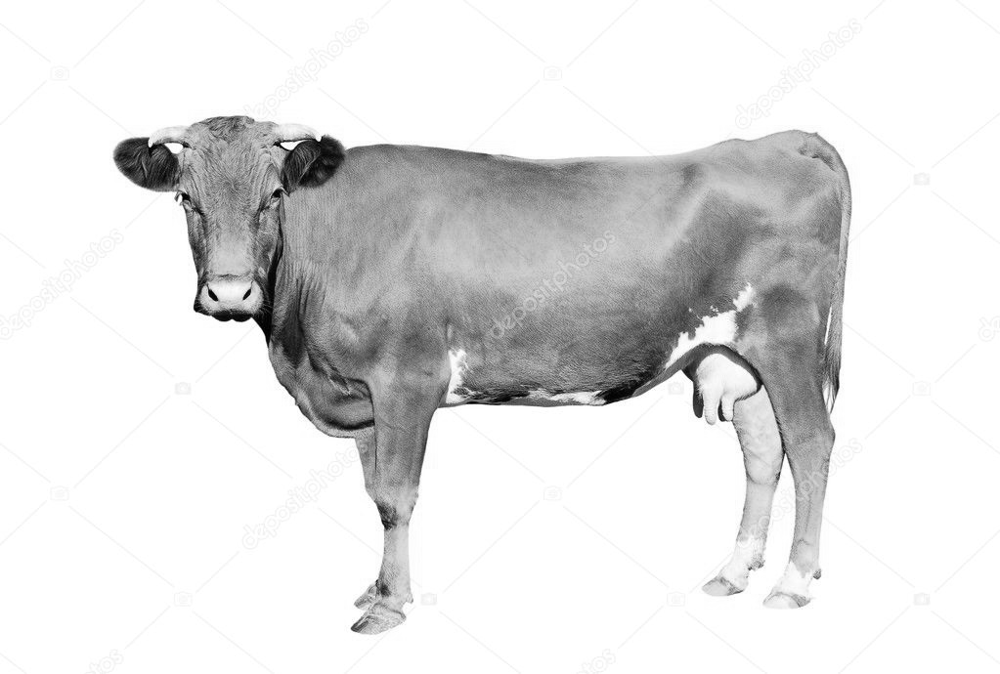

In [ ]:
from PIL import Image

# Baca gambar
gambar = Image.open('/content/drive/MyDrive/sapi3.jpg')

# Ubah gambar ke mode grayscale
gambar_grayscale = gambar.convert('L')

# Dapatkan matriks piksel
piksel = list(gambar_grayscale.getdata())

# Faktor kontras
faktor_kontras = 1
piksel_hasil = []

for p in piksel:
    piksel_baru = int(p * faktor_kontras)
    piksel_hasil.append(piksel_baru)

# Buat gambar baru dari matriks piksel yang telah dimodifikasi
gambar_hasil_kontras_sapinobg = Image.new('L', gambar_grayscale.size)
gambar_hasil_kontras_sapinobg.putdata(piksel_hasil)

# Tampilkan gambar hasil
gambar_hasil_kontras_sapinobg.show()

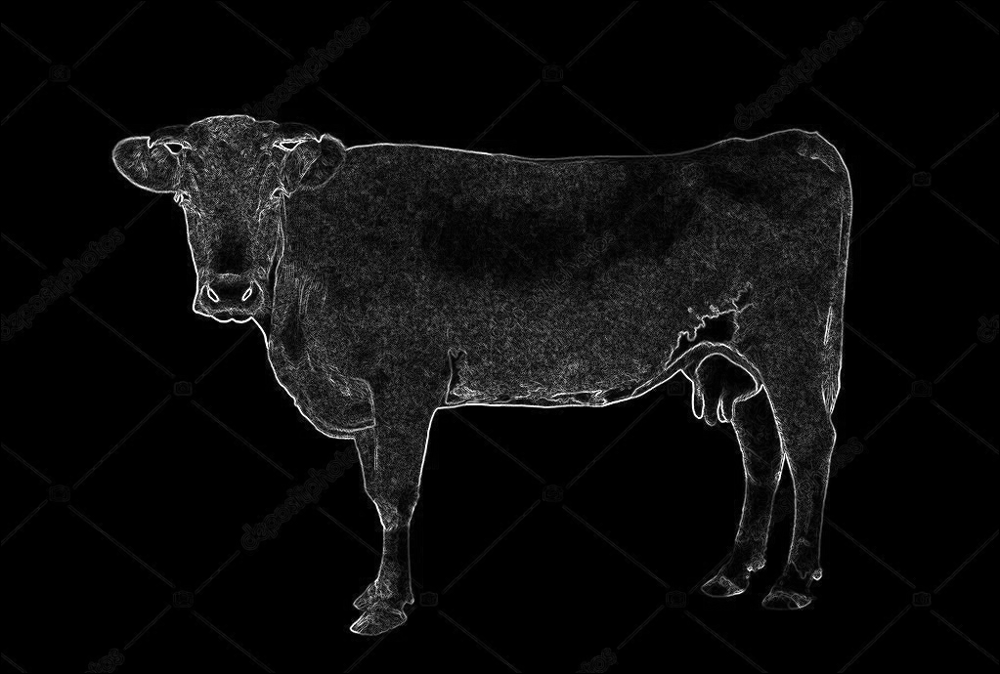

In [ ]:
from PIL import Image

# Load image
image = gambar_hasil_kontras_sapinobg
width, height = image.size

# Get pixel values
pixels = image.load()

# Apply finite difference kernel
edges = [[0] * height for _ in range(width)]
for y in range(1, height - 1):
    for x in range(1, width - 1):
        # Calculate finite differences in x and y directions
        dx = pixels[x + 1, y] - pixels[x - 1, y]
        dy = pixels[x, y + 1] - pixels[x, y - 1]
        magnitude = int((dx ** 2 + dy ** 2) ** 0.5)  # Magnitude of the gradient
        edges[x][y] = magnitude

# Normalize and convert back to uint8
max_magnitude = max(max(edges))
for y in range(height):
    for x in range(width):
        edges[x][y] = int(edges[x][y] * 255 / max_magnitude)

# Create a new image with edge pixels
edge_image_sapinobg = Image.new('L', (width, height))
edge_pixels = edge_image_sapinobg.load()
for y in range(height):
    for x in range(width):
        edge_pixels[x, y] = edges[x][y]

# Display the result
edge_image_sapinobg.show()

## Pencerminan Gambar

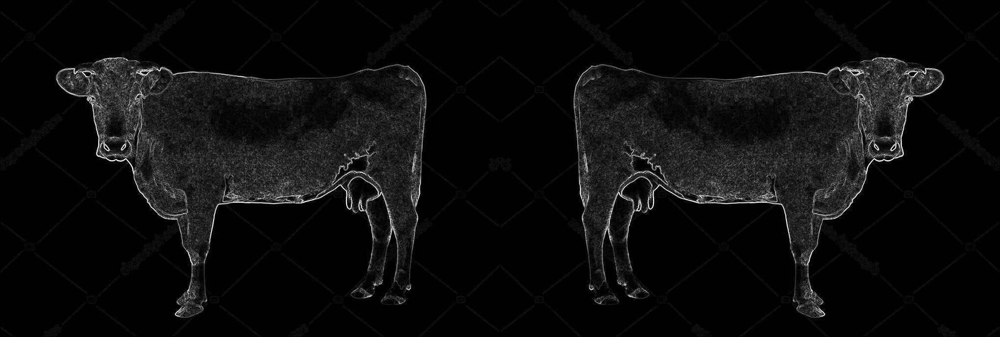

In [ ]:
from PIL import Image

# Baca gambar
gambar = edge_image_sapinobg

# Ubah gambar ke mode RGB
gambar_rgb = gambar.convert('RGB')

# Dapatkan dimensi gambar
lebar, tinggi = gambar_rgb.size

# Buat gambar baru sebagai cermin
gambar_cermin = Image.new('RGB', (lebar * 2, tinggi))

# Salin piksel-piksel gambar asli ke gambar cermin
for y in range(tinggi):
    for x in range(lebar):
        piksel = gambar_rgb.getpixel((x, y))
        gambar_cermin.putpixel((x, y), piksel)
        gambar_cermin.putpixel((lebar * 2 - x - 1, y), piksel)

# Tampilkan gambar cermin
gambar_cermin.show()

Melakukan pemotongan pada gambar cermin

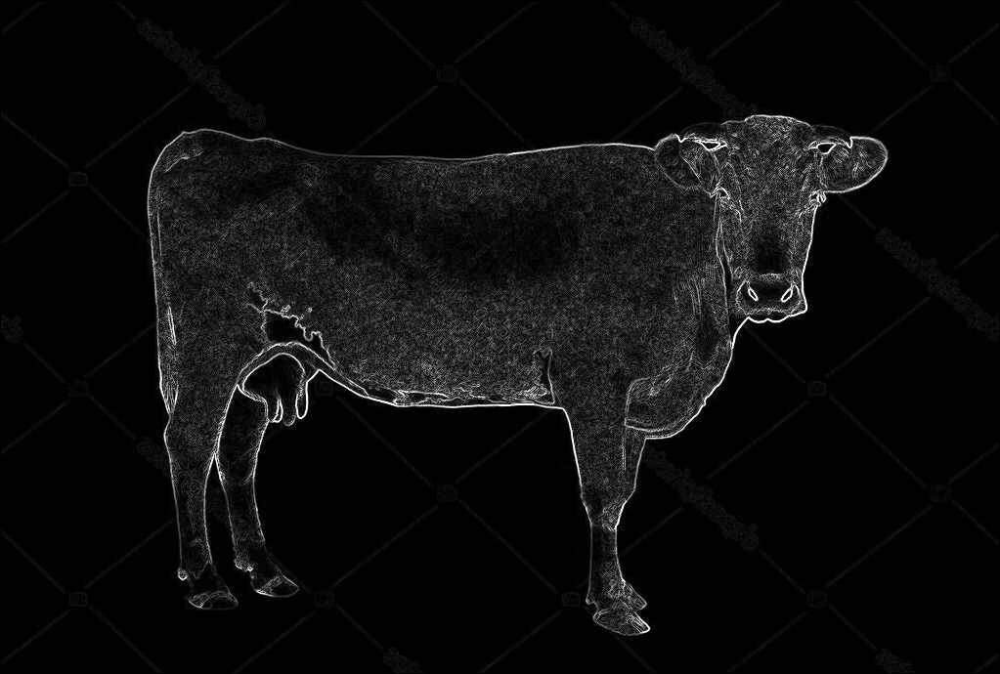

In [ ]:
from PIL import Image

# Baca gambar cermin
gambar_cermin_crop = gambar_cermin

# Dapatkan lebar dan tinggi gambar cermin
lebar, tinggi = gambar_cermin_crop.size

# Hitung lebar setengah gambar cermin
lebar_setengah = lebar // 2

# Potong gambar cermin untuk menampilkan hanya hasil cerminnya
hasil_cermin = gambar_cermin_crop.crop((lebar_setengah, 0, lebar, tinggi))

# Tampilkan hasil cermin
hasil_cermin.show()


Resize gambar menjadi 500x500 px

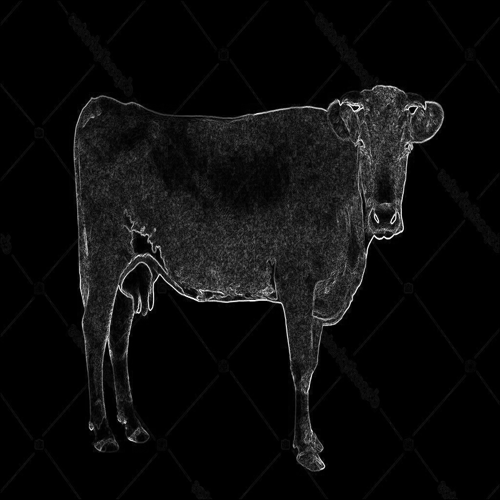

In [ ]:
from PIL import Image

# Baca gambar cermin
gambar_cermin_crop = gambar_cermin

# Dapatkan lebar dan tinggi gambar cermin
lebar, tinggi = gambar_cermin_crop.size

# Hitung lebar setengah gambar cermin
lebar_setengah = lebar // 2

# Potong gambar cermin untuk menampilkan hanya hasil cerminnya
hasil_cermin = gambar_cermin_crop.crop((lebar_setengah, 0, lebar, tinggi))

# Ubah ukuran gambar menjadi 500x500
hasil_cermin500 = hasil_cermin.resize((500, 500))

# Tampilkan hasil cermin
hasil_cermin500.show()


Mengubah gambar menjdai grayscale

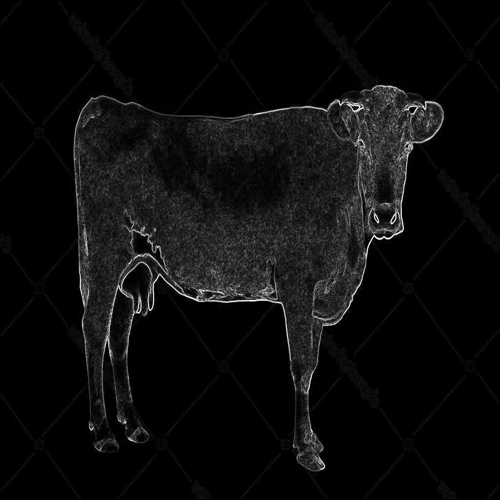

In [ ]:
from PIL import Image

# Baca gambar cermin
gambar_cermin_crop = gambar_cermin

# Dapatkan lebar dan tinggi gambar cermin
lebar, tinggi = gambar_cermin_crop.size

# Hitung lebar setengah gambar cermin
lebar_setengah = lebar // 2

# Potong gambar cermin untuk menampilkan hanya hasil cerminnya
hasil_cermin = gambar_cermin_crop.crop((lebar_setengah, 0, lebar, tinggi))

# Ubah ukuran gambar menjadi 500x500
hasil_cermin500 = hasil_cermin.resize((500, 500))

# Konversi gambar menjadi grayscale
hasil_cermin_grayscale = hasil_cermin500.convert("L")

# Tampilkan hasil cermin grayscale
hasil_cermin_grayscale.show()


In [ ]:
nama_file_hasil = '/content/drive/MyDrive/sapi111.jpg' 
hasil_cermin_grayscale.save(nama_file_hasil)

## Penggabungan / Overlay Gambar

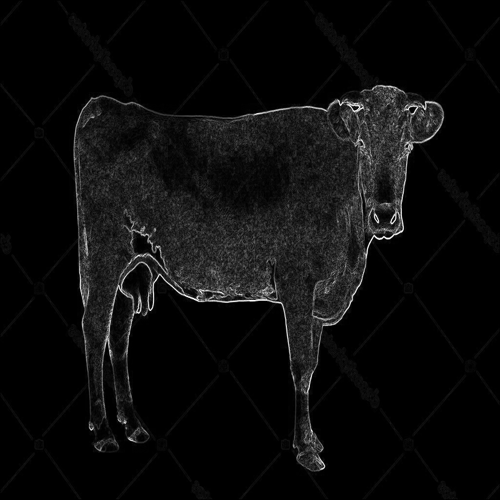

In [ ]:
from PIL import Image

# Baca gambar pertama
gambar1 = gambar_hasil500

# Baca gambar kedua
gambar2 = hasil_cermin500

# Ubah ukuran gambar kedua menjadi sesuai dengan gambar pertama
gambar2 = gambar2.resize(gambar1.size)

# Buat gambar overlay dengan mode RGBA
gambar_overlay = Image.new('RGBA', gambar1.size)

# Tumpangkan gambar kedua ke gambar overlay
gambar_overlay.paste(gambar2, (0, 0))

# Gabungkan gambar pertama dengan gambar overlay
gambar_gabungan = Image.alpha_composite(gambar1.convert('RGBA'), gambar_overlay)

# Tampilkan gambar gabungan
gambar_gabungan.show()


## Mencari Matrix Pixel dari Dua Gambar

In [ ]:
from PIL import Image

# Baca gambar pertama
gambar1 = gambar_hasil

# Baca gambar kedua
gambar2 = hasil_cermin_grayscale

# Ubah ukuran kedua gambar menjadi ukuran yang sama
ukuran_gambar = (500, 500)
gambar1 = gambar1.resize(ukuran_gambar)
gambar2 = gambar2.resize(ukuran_gambar)

# Dapatkan matriks piksel dari kedua gambar
matriks_piksel1 = list(gambar1.getdata())
lebar1, tinggi1 = gambar1.size

matriks_piksel2 = list(gambar2.getdata())
lebar2, tinggi2 = gambar2.size

# Cetak matriks piksel dari gambar pertama
print("Matriks piksel gambar pertama:")
mode = gambar1.mode
if mode == "RGB":
    for y in range(tinggi1):
        for x in range(lebar1):
            piksel = matriks_piksel1[y * lebar1 + x]
            r, g, b = piksel
            print(f"({r:3}, {g:3}, {b:3})", end=" ")
        print()
elif mode == "RGBA":
    for y in range(tinggi1):
        for x in range(lebar1):
            piksel = matriks_piksel1[y * lebar1 + x]
            r, g, b, a = piksel
            print(f"({r:3}, {g:3}, {b:3}, {a:3})", end=" ")
        print()

elif mode == "L":
    for y in range(tinggi1):
        for x in range(lebar1):
            piksel = matriks_piksel1[y * lebar1 + x]
            print(f"{piksel:3}", end=" ")
        print()

else:
    print("Mode gambar tidak didukung")

print()

# Cetak matriks piksel dari gambar kedua
print("Matriks piksel gambar kedua:")
mode = gambar2.mode
# if mode == "RGB":
#     for y in range(tinggi2):
#         for x in range(lebar2):
#             piksel = matriks_piksel2[y * lebar2 + x]
#             r, g, b = piksel
#             print(f"({r:3}, {g:3}, {b:3})", end=" ")
#         print()
# elif mode == "RGBA":
#     for y in range(tinggi2):
#         for x in range(lebar2):
#             piksel = matriks_piksel2[y * lebar2 + x]
#             r, g, b, a = piksel
#             print(f"({r:3}, {g:3}, {b:3}, {a:3})", end=" ")
#         print()

if mode == "L":
    for y in range(tinggi1):
        for x in range(lebar1):
            piksel = matriks_piksel1[y * lebar1 + x]
            print(f"{piksel:3}", end=" ")
        print()

else:
    print("Mode gambar tidak didukung")


Matriks piksel gambar pertama:
  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  

## Cek apakah terdapat dua nilai pixel yang bernilai bukan 0 yang sama pada posisi yang sama juga dari dua gambar

In [ ]:
from PIL import Image

# Baca gambar pertama
gambar1 = gambar_hasil

# Baca gambar kedua
gambar2 = hasil_cermin_grayscale

# Ubah ukuran kedua gambar menjadi ukuran yang sama
ukuran_gambar = (500, 500)
gambar1 = gambar1.resize(ukuran_gambar)
gambar2 = gambar2.resize(ukuran_gambar)

# Dapatkan matriks piksel dari kedua gambar
matriks_piksel1 = list(gambar1.getdata())
lebar1, tinggi1 = gambar1.size

matriks_piksel2 = list(gambar2.getdata())
lebar2, tinggi2 = gambar2.size

# Cek apakah terdapat angka bukan 0 di tempat yang sama
terdapat_angka_bukan_0 = False
for y in range(tinggi1):
    for x in range(lebar1):
        piksel1 = matriks_piksel1[y * lebar1 + x]
        piksel2 = matriks_piksel2[y * lebar2 + x]
        if piksel1 != 0 and piksel2 != 0:
            terdapat_angka_bukan_0 = True
            break

# Print hasil
if terdapat_angka_bukan_0:
    print("Terdapat angka bukan 0 di tempat yang sama antara kedua gambar.")
else:
    print("Tidak terdapat angka bukan 0 di tempat yang sama antara kedua gambar.")


Terdapat angka bukan 0 di tempat yang sama antara kedua gambar.


## Print dimana saja letak nilai pixel yang sama tersebut

In [ ]:
from PIL import Image

# Baca gambar pertama
gambar1 = gambar_hasil

# Baca gambar kedua
gambar2 = hasil_cermin_grayscale

# Ubah ukuran kedua gambar menjadi ukuran yang sama
ukuran_gambar = (500, 500)
gambar1 = gambar1.resize(ukuran_gambar)
gambar2 = gambar2.resize(ukuran_gambar)

# Dapatkan matriks piksel dari kedua gambar
matriks_piksel1 = list(gambar1.getdata())
lebar1, tinggi1 = gambar1.size

matriks_piksel2 = list(gambar2.getdata())
lebar2, tinggi2 = gambar2.size

# Inisialisasi daftar untuk menyimpan posisi tempat terdapat angka bukan 0
posisi_angka_bukan_0 = []

# Cek apakah terdapat angka bukan 0 di tempat yang sama
for y in range(tinggi1):
    for x in range(lebar1):
        piksel1 = matriks_piksel1[y * lebar1 + x]
        piksel2 = matriks_piksel2[y * lebar2 + x]
        if piksel1 != 0 and piksel2 != 0:
            posisi_angka_bukan_0.append((x, y))

# Print hasil
if posisi_angka_bukan_0:
    print("Terdapat angka bukan 0 pada posisi berikut:")
    for posisi in posisi_angka_bukan_0:
        print(f"({posisi[0]}, {posisi[1]})")
else:
    print("Tidak terdapat angka bukan 0 di tempat yang sama antara kedua gambar.")


Streaming output truncated to the last 5000 lines.
(301, 443)
(302, 443)
(303, 443)
(304, 443)
(305, 443)
(306, 443)
(307, 443)
(308, 443)
(309, 443)
(310, 443)
(311, 443)
(312, 443)
(313, 443)
(314, 443)
(315, 443)
(316, 443)
(317, 443)
(318, 443)
(319, 443)
(320, 443)
(321, 443)
(322, 443)
(323, 443)
(403, 443)
(404, 443)
(405, 443)
(406, 443)
(407, 443)
(408, 443)
(409, 443)
(410, 443)
(411, 443)
(412, 443)
(413, 443)
(34, 444)
(35, 444)
(36, 444)
(37, 444)
(38, 444)
(39, 444)
(40, 444)
(41, 444)
(42, 444)
(43, 444)
(46, 444)
(89, 444)
(90, 444)
(91, 444)
(92, 444)
(93, 444)
(94, 444)
(95, 444)
(96, 444)
(97, 444)
(98, 444)
(99, 444)
(100, 444)
(101, 444)
(102, 444)
(103, 444)
(104, 444)
(105, 444)
(106, 444)
(107, 444)
(108, 444)
(109, 444)
(110, 444)
(111, 444)
(112, 444)
(113, 444)
(114, 444)
(115, 444)
(116, 444)
(117, 444)
(118, 444)
(119, 444)
(120, 444)
(121, 444)
(122, 444)
(123, 444)
(132, 444)
(133, 444)
(134, 444)
(135, 444)
(136, 444)
(137, 444)
(138, 444)
(139, 444)
(14

## Print persentase kemiripan pixel dari kedua gambar

In [ ]:
from PIL import Image

# Baca gambar pertama
gambar1 = gambar_hasil

# Baca gambar kedua
gambar2 = hasil_cermin_grayscale

# Ubah ukuran kedua gambar menjadi ukuran yang sama
ukuran_gambar = (500, 500)
gambar1 = gambar1.resize(ukuran_gambar)
gambar2 = gambar2.resize(ukuran_gambar)

# Dapatkan matriks piksel dari kedua gambar
matriks_piksel1 = list(gambar1.getdata())
lebar1, tinggi1 = gambar1.size

matriks_piksel2 = list(gambar2.getdata())
lebar2, tinggi2 = gambar2.size

# Hitung jumlah piksel yang sama antara kedua gambar
jumlah_piksel_sama = 0
total_piksel = lebar1 * tinggi1

for i in range(total_piksel):
    piksel1 = matriks_piksel1[i]
    piksel2 = matriks_piksel2[i]

    if piksel1 == piksel2:
        jumlah_piksel_sama += 1

# Hitung persentase kemiripan antara kedua gambar
kemiripan = (jumlah_piksel_sama / total_piksel) * 100

# Print hasil kemiripan
print("Kemiripan antara kedua gambar:")
print(f"Jumlah piksel yang sama: {jumlah_piksel_sama}")
print(f"Total piksel: {total_piksel}")
print(f"Persentase kemiripan: {kemiripan}%")


Kemiripan antara kedua gambar:
Jumlah piksel yang sama: 14719
Total piksel: 250000
Persentase kemiripan: 5.8876%


## Mengatur posisi

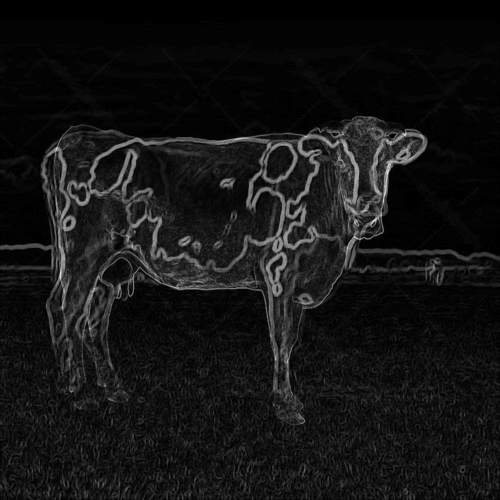


Kesamaan antara gambar pertama dan gambar kedua:
Jumlah piksel yang sama: 17928
Total piksel: 250000
Persentase kesamaan: 7.1712%


In [ ]:
from PIL import Image

# Baca gambar pertama
gambar1 = gambar_hasil500

# Baca gambar kedua
gambar2 = hasil_cermin500

# Ubah ukuran gambar kedua menjadi sesuai dengan gambar pertama
ukuran = ((500, 400))
gambar2 = gambar2.resize(ukuran)

# Buat gambar overlay dengan mode RGBA
gambar_overlay = Image.new('RGBA', gambar1.size)

# Tentukan posisi baru gambar kedua
posisi_x = -20  # Koordinat x baru
posisi_y = 48  # Koordinat y baru

# Tumpangkan gambar kedua ke gambar overlay dengan posisi baru
gambar_overlay.paste(gambar2, (posisi_x, posisi_y))

# Gabungkan gambar pertama dengan gambar overlay
gambar_gabungan = Image.blend(gambar1.convert('L'), gambar_overlay.convert('L'), alpha=0.5)

# Deteksi kesamaan berdasarkan matriks piksel gambar gabungan
matriks_piksel_gabungan = list(gambar_gabungan.getdata())
lebar, tinggi = gambar_gabungan.size

# Tampilkan gambar gabungan
gambar_gabungan.show()

print("")

# Deteksi kesamaan berdasarkan matriks piksel gambar gabungan
jumlah_piksel_sama = 0
total_piksel = lebar * tinggi

for piksel in matriks_piksel_gabungan:
    if piksel == 0:
        jumlah_piksel_sama += 1

# Hitung persentase kesamaan
persentase_kesamaan = (jumlah_piksel_sama / total_piksel) * 100

# Print hasil kesamaan
print("Kesamaan antara gambar pertama dan gambar kedua:")
print(f"Jumlah piksel yang sama: {jumlah_piksel_sama}")
print(f"Total piksel: {total_piksel}")
print(f"Persentase kesamaan: {persentase_kesamaan}%")


## Remove background sapi dengan API Replicate

In [ ]:
pip install replicate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
os.environ["REPLICATE_API_TOKEN"] = "r8_6pyc9R9vcIEdgEXjdG7DBnihm8xQD1n44699t"

In [ ]:
import replicate
output = replicate.run(
    "cjwbw/rembg:fb8af171cfa1616ddcf1242c093f9c46bcada5ad4cf6f2fbe8b81b330ec5c003",
    input={"image": open("/content/drive/MyDrive/sapi111.jpg", "rb")}
)
print(output)

https://replicate.delivery/pbxt/exoRvB5GessMc0JoqgCSNmMuviDNbKmduBGAXfsyXQuYNFHiA/out.png


## Overlay dua gambar

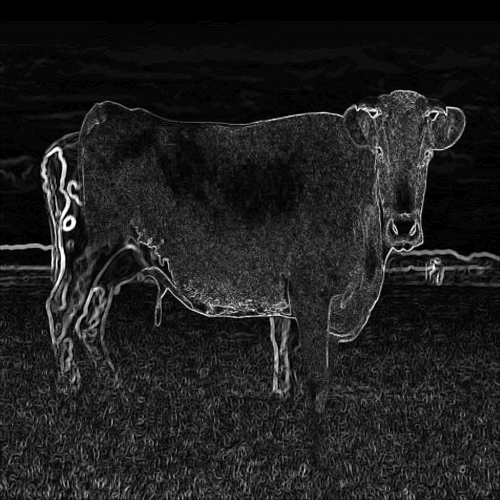

In [ ]:
from PIL import Image

# Baca gambar pertama
gambar1 = gambar_hasil500

# Baca gambar kedua
gambar2 = Image.open('/content/drive/MyDrive/sapi333nobg.png')

# Ubah ukuran gambar kedua menjadi sesuai dengan gambar pertama
ukuran = ((525, 525))
gambar2 = gambar2.resize(ukuran)

# Buat gambar overlay dengan mode RGBA
gambar_overlay = Image.new('RGBA', gambar1.size)

# Tumpangkan gambar kedua ke gambar overlay
gambar_overlay.paste(gambar2, (0, 0))

# Gabungkan gambar pertama dengan gambar overlay
gambar_gabungan = Image.alpha_composite(gambar1.convert('RGBA'), gambar_overlay)

# Tampilkan gambar gabungan
gambar_gabungan.show()


## Mengatur posisi

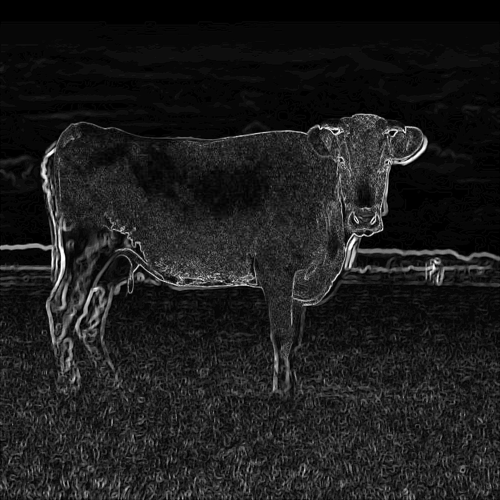

In [ ]:
from PIL import Image

# Baca gambar pertama
gambar1 = gambar_hasil500

# Baca gambar kedua
gambar2 = Image.open('/content/drive/MyDrive/sapi333nobg.png')

# Ubah ukuran gambar kedua menjadi sesuai dengan gambar pertama
ukuran = ((500, 400))
gambar2 = gambar2.resize(ukuran)

# Buat gambar overlay dengan mode RGBA
gambar_overlay = Image.new('RGBA', gambar1.size)

# Tentukan posisi baru gambar kedua
posisi_x = -20  # Koordinat x baru
posisi_y = 45  # Koordinat y baru

# Tumpangkan gambar kedua ke gambar overlay dengan posisi baru
gambar_overlay.paste(gambar2, (posisi_x, posisi_y))

# Gabungkan gambar pertama dengan gambar overlay
gambar_gabungan = Image.alpha_composite(gambar1.convert('RGBA'), gambar_overlay)

# Tampilkan gambar gabungan
gambar_gabungan.show()

## Mencari persentase kesamaan pixel overlay gambar

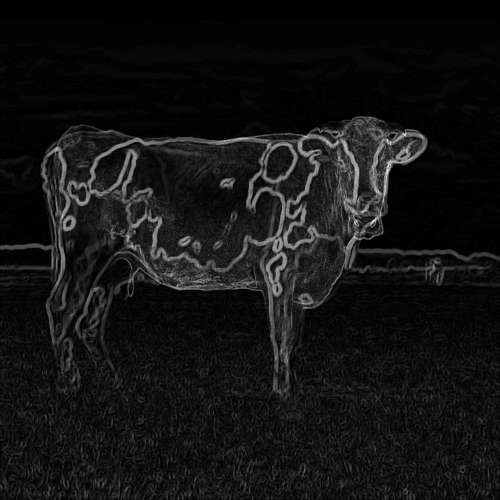


Kesamaan antara gambar pertama dan gambar kedua:
Jumlah piksel yang sama: 19492
Total piksel: 250000
Persentase kesamaan: 7.796799999999999%


In [ ]:
from PIL import Image

# Baca gambar pertama
gambar1 = gambar_hasil500

# Baca gambar kedua
gambar2 = Image.open('/content/drive/MyDrive/sapi333nobg.png')

# Ubah ukuran gambar kedua menjadi sesuai dengan gambar pertama
ukuran = ((500, 400))
gambar2 = gambar2.resize(ukuran)

# Buat gambar overlay dengan mode RGBA
gambar_overlay = Image.new('RGBA', gambar1.size)

# Tentukan posisi baru gambar kedua
posisi_x = -20  # Koordinat x baru
posisi_y = 48  # Koordinat y baru

# Tumpangkan gambar kedua ke gambar overlay dengan posisi baru
gambar_overlay.paste(gambar2, (posisi_x, posisi_y))

# Gabungkan gambar pertama dengan gambar overlay
gambar_gabungan = Image.blend(gambar1.convert('L'), gambar_overlay.convert('L'), alpha=0.5)

# Deteksi kesamaan berdasarkan matriks piksel gambar gabungan
matriks_piksel_gabungan = list(gambar_gabungan.getdata())
lebar, tinggi = gambar_gabungan.size

# Tampilkan gambar gabungan
gambar_gabungan.show()

print("")

# Deteksi kesamaan berdasarkan matriks piksel gambar gabungan
jumlah_piksel_sama = 0
total_piksel = lebar * tinggi

for piksel in matriks_piksel_gabungan:
    if piksel == 0:
        jumlah_piksel_sama += 1

# Hitung persentase kesamaan
persentase_kesamaan = (jumlah_piksel_sama / total_piksel) * 100

# Print hasil kesamaan
print("Kesamaan antara gambar pertama dan gambar kedua:")
print(f"Jumlah piksel yang sama: {jumlah_piksel_sama}")
print(f"Total piksel: {total_piksel}")
print(f"Persentase kesamaan: {persentase_kesamaan}%")
